In [5]:
import skfem
import numpy as np
#from skfem import MeshTri
import matplotlib.pyplot as plt
#from scipy.spatial import Delaunay
#from scipy.spatial import distance
#from scipy.sparse.linalg import splu 
#from skfem.models.poisson import laplace, mass
from skfem.visuals.matplotlib import plot
#from scipy.sparse import csc_matrix
import pygmsh

### Brus and Gray Scott models on different shaped domains using pygmsh generated meshes
### natural boundary conditions 

Brus 
\begin{align} 
    R_u &= \alpha - (\beta+1) u + u^2 v     \\
    R_v &= \beta u - u^2 v
\end{align}

GS 
\begin{align} 
    R_u &=  - u v^2  + \alpha (1-u) \\
    R_v &=  u v^2 -(\alpha+ \beta) v
\end{align}

In [2]:
def Reaction(u,v,alpha,beta,rdtype):
    if (rdtype == 'FN'):  # FitzHugh Nagumo model
        Ru,Rv=R_FN(u,v,alpha,beta)
        return Ru,Rv
    if (rdtype == 'Br'):  # Brusellator model
        Ru,Rv= R_Br(u,v,alpha,beta)
        return Ru,Rv
    if (rdtype == 'GS'):  # Gray-Scott model
        Ru,Rv = R_GS(u,v,alpha,beta)
        return Ru,Rv
    if (rdtype == 'Heat'):  # Heat equation 
        n = len(u)
        Ru = np.zeros(n); Rv = np.zeros(n)
        return Ru,Rv
    print('invalid reaction type')

#The FitzHugh-Nagumo Reaction Diffusion Model
# example: Du, Dv, alpha, beta = 1, 10, 0.1, 1, dt=0.01, dx = 1
def R_FN(u,v,alpha,beta): 
    Ru =  u - u**3 - v + alpha 
    Rv = (u - v)*beta
    return Ru,Rv

# Brusselator Reaction Diffusion model
# example: Du, Dv, alpha, beta = 2, 22, 5, 9 # dt=0.005, dx=1
# u = alpha, v = beta/alpha is a fixed point of R
def R_Br(u,v,alpha,beta): 
    Ru = alpha - (beta+1)*u + (u**2)*v    
    Rv = beta*u - (u**2)*v
    return Ru,Rv

# The Gray-Scott Reaction Diffusion model
# alpha is feed rate for u and kills v, beta is kill or drain rate for v
# example: Du = 0.2, Dv = Du/2, alpha = 0.037 and beta = 0.06 , dx=1
def R_GS(u,v,alpha,beta): 
    Ru =  -u*(v**2) + alpha*(1-u) 
    Rv =  u*(v**2) -(alpha+ beta)*v
    return Ru,Rv


# display u,v fields 
# calls skfem's plot routine 
def disp(mesh,u,v,basis,t):
    fig,axarr = plt.subplots(1,2,figsize=(6,3),sharex=True,sharey=True,dpi=100)
    plt.subplots_adjust(left=0.09,right=0.95,bottom=0.01,top=0.99)
    ax0 = axarr[0]; ax1 = axarr[1]
    ax0.set_aspect('equal'); ax1.set_aspect('equal')
    #ax_j0 = plot(mesh, u[basis.nodal_dofs.flatten()], shading='gouraud', ax = ax0)
    #ax_j1 = plot(mesh, v[basis.nodal_dofs.flatten()], shading='gouraud', ax = ax1)
    ax_j0 = plot(basis, u, shading='gouraud', ax = ax0)   # this is way better!!!!!!!!!!!!!!!!!!!!!!!!!
    ax_j1 = plot(basis, v, shading='gouraud', ax = ax1)
    #fig = ax0.get_figure()
    field0 = ax0.get_children()[0]  # vertex-based temperature-colour
    field1 = ax1.get_children()[0]  # vertex-based temperature-colour
    fig.colorbar(field0,shrink=0.7)
    fig.colorbar(field1,shrink=0.7)
    title = ax0.set_title(f'u,  $t$ = {t:.3f}')
    title = ax1.set_title(f'v')
    plt.show()
    return fig,axarr

# Globals are Reaction() function and that's it 
# sim is now a class sim_info 
def one_step(t,u,v,sim):
    t += sim.dt
    Ru,Rv = Reaction(u,v,sim.alpha,sim.beta,sim.rdtype)
    u = sim.backsolve_1(sim.B_1 @ u)    
    v = sim.backsolve_2(sim.B_2 @ v)  
    u += Ru*sim.dt
    v += Rv*sim.dt
    return t,u,v

class sim_info:
    def __init__(self,D_u,D_v,dt,rdtype,mesh,basis):
        self.D_u = D_u
        self.D_v = D_v
        self.dt = dt
        self.mesh = mesh
        self.basis = basis 
        self.rdtype = rdtype

        # stored information
        self.u_init = 0.0
        self.v_init = 0.0
        self.B_1 = 0.0
        self.B_2 = 0.0
        self.backsolve_1 = 0.0
        self.backsolve_2 = 0.0
        self.alpha = 5.  
        self.beta = 9.

from skfem.models.poisson import laplace, mass
from scipy.sparse import csc_matrix
from scipy.sparse.linalg import splu 

# create ops used in reaction diffusion equation, also generate initial conditions 
def mkops(sim):
    D_u = sim.D_u
    D_v = sim.D_v
    rdtype = sim.rdtype
    dt = sim.dt
    basis = sim.basis 
    mesh = sim.mesh
    
    L_1 = D_u * skfem.asm(laplace, basis)   # Laplacian for u field 
    L_2 = D_v * skfem.asm(laplace, basis)   # for v field 
    M = skfem.asm(mass, basis)  # mass matrix (sizes of triangles) 
    theta = 0.5                     # Crank–Nicolson algorithm for a diffusion PDE
    A_1 = M + theta * L_1 * dt
    B_1 = M - (1 - theta) * L_1 * dt
    A_2 = M + theta * L_2 * dt
    B_2 = M - (1 - theta) * L_2 * dt
    # Convert to CSC format
    A_1_csc = csc_matrix(A_1)
    A_2_csc = csc_matrix(A_2)

    epsilon = 1e-10  # work around if you get a singular matrix 
    A_1_csc += epsilon * np.eye(A_1_csc.shape[0])
    A_2_csc += epsilon * np.eye(A_2_csc.shape[0])

    # Perform inversion
    backsolve_1 = splu(A_1_csc.T).solve
    backsolve_2 = splu(A_2_csc.T).solve

    # store ops
    sim.B_1 = B_1
    sim.B_2 = B_2
    sim.backsolve_1 = backsolve_1
    sim.backsolve_2 = backsolve_2

    nnodes = len(basis.doflocs[0])
    # make initial conditions for Brus and GS models 
    if (rdtype == 'Br'):   # generate initial conditions for Br model 
        u_init = np.random.random(nnodes)*0.05
        v_init = np.random.random(nnodes)*0.05

    if (rdtype == 'GS'):  # GS model initial conditions 
        u_init = np.random.random(nnodes)*0.0 + 1.
        v_init = np.random.random(nnodes)*0.0
        for i in range(40):
            j = np.random.randint(0,nnodes)
            v_init[j] = 0.7

    # show initial conditions 
    disp(mesh,u_init,v_init,basis,0.0)
    
    # store initial conditions 
    sim.u_init = u_init
    sim.v_init = v_init
    
    #return B_1,B_2,backsolve_1,backsolve_2

In [3]:
def mkpngs(froot, i, mesh,u,v,basis,t):
    fig,axarr = disp(mesh,u,v,basis,t)
    istr = '{:d}'.format(i)
    if (i <10):
        istr = '0' + istr 
    if (i <100):
        istr = '0' + istr 
    fname = froot + '_' + istr + '.png'
    print(fname)
    fig.savefig(fname)
    plt.close(fig)
    

Transforming over 1000 vertices to C_CONTIGUOUS.
Transforming over 1000 elements to C_CONTIGUOUS.


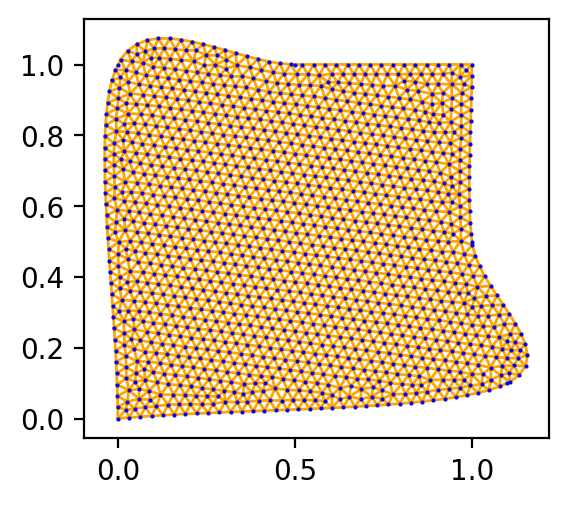

In [6]:
# make a mesh with some splines
with pygmsh.geo.Geometry() as geom:
    lcar = 0.032  # sets refinement level
    p1 = geom.add_point([0.0, 0.0], lcar)
    p2 = geom.add_point([1.1, 0.1], lcar)
    p3 = geom.add_point([1.0, 0.5], lcar)
    p4 = geom.add_point([1.0, 1.0], lcar)
    s1 = geom.add_spline([p1, p2, p3, p4])

    p2 = geom.add_point([0.0, 1.0], lcar)
    p3 = geom.add_point([0.5, 1.0], lcar)
    s2 = geom.add_spline([p4, p3, p2, p1])

    ll = geom.add_curve_loop([s1, s2])
    pl = geom.add_plane_surface(ll) 

    mesh = geom.generate_mesh()

pts = mesh.points
cells = mesh.cells
pts_2d = pts[:,0:2]  # get rid of z part of points 
triangles = np.squeeze(cells[1].data)  # list of triangles 

fig, ax = plt.subplots(1,1,figsize=(3,3),dpi=200)
#ax.plot(pts[:,0],pts[:,1],'o')
ax.triplot(pts_2d[:,0], pts_2d[:,1], triangles,markersize=3, marker='.',lw=1,color='orange',mfc='blue',mew=0)
ax.set_aspect('equal')

new_mesh = skfem.MeshTri(pts_2d.T, triangles.T)  # uses meshio format for cellblocks!

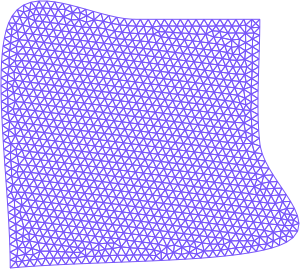

In [8]:
element = skfem.ElementTriP2()  # or ElementTriP2?  a triangular element
basis = skfem.Basis(new_mesh, element)
new_mesh

# I tried P2, it was slower, looked better!

/var/folders/l_/tk7gphlj0d38754sb6x8p1f00000gn/T/ipykernel_38167/4293279018.py:122: SparseEfficiencyWarning: splu converted its input to CSC format
  backsolve_1 = splu(A_1_csc.T).solve
/var/folders/l_/tk7gphlj0d38754sb6x8p1f00000gn/T/ipykernel_38167/4293279018.py:123: SparseEfficiencyWarning: splu converted its input to CSC format
  backsolve_2 = splu(A_2_csc.T).solve


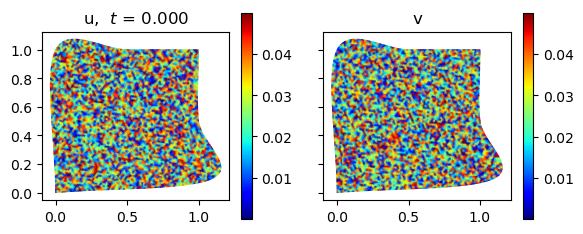

In [9]:
D_u  = 1.e-3  #diffusion coefficients 
D_v = D_u*11
dt = .002    # timestep 
sim1 = sim_info(D_u,D_v,dt,'Br',new_mesh,basis)
# get ops and initial conditions 
mkops(sim1)

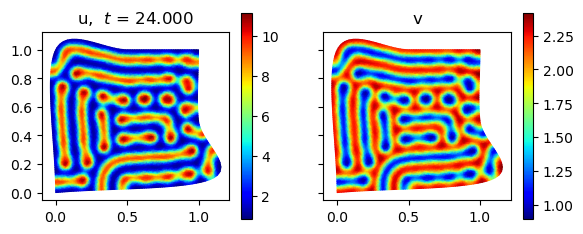

In [53]:
u = np.copy(sim1.u_init); v = np.copy(sim1.v_init);   t=0.0
sim1.alpha = 5.; sim1.beta = 9.
for i in range(12000):
    t, u, v = one_step(t, u,v,sim1)  
fig,axarr = disp(new_mesh,u,v,basis,t)

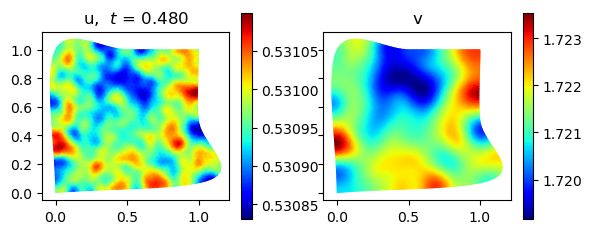

br_var_1_000.png


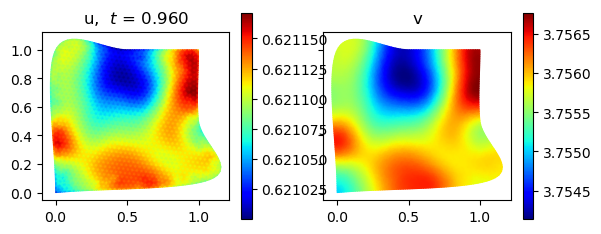

br_var_1_001.png


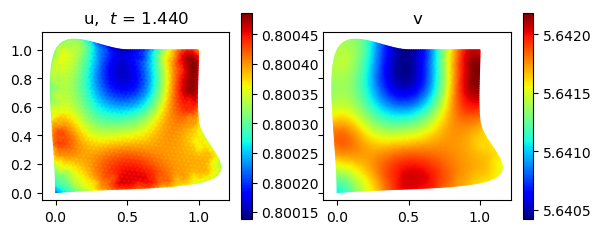

br_var_1_002.png


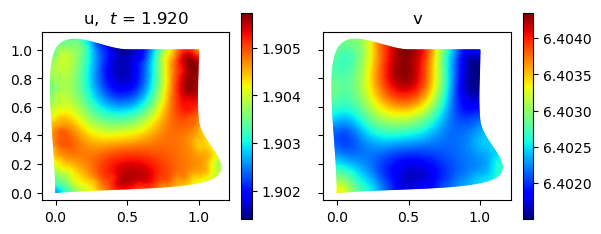

br_var_1_003.png


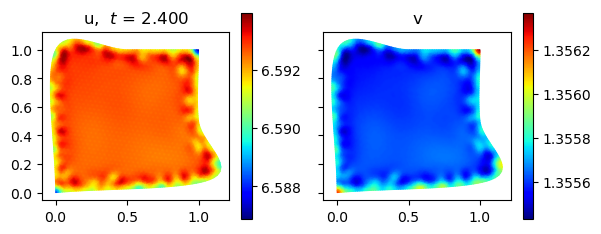

br_var_1_004.png


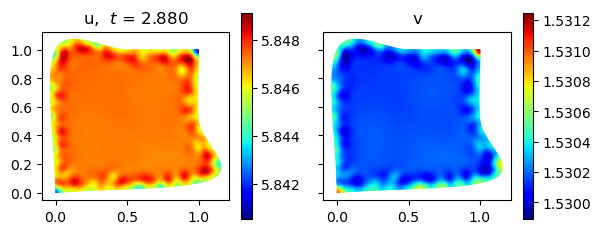

br_var_1_005.png


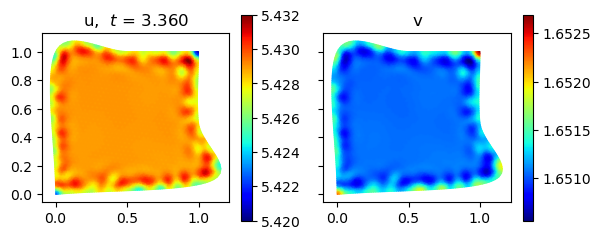

br_var_1_006.png


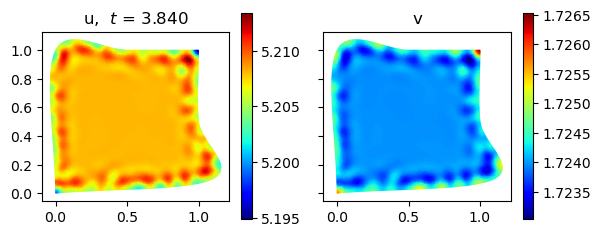

br_var_1_007.png


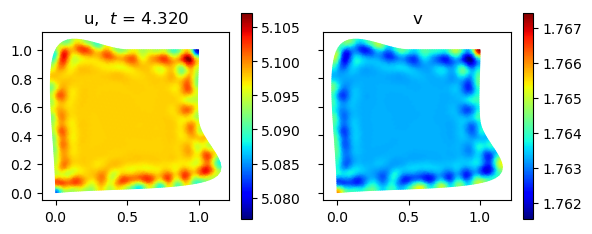

br_var_1_008.png


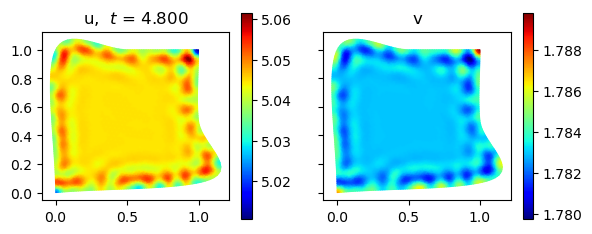

br_var_1_009.png


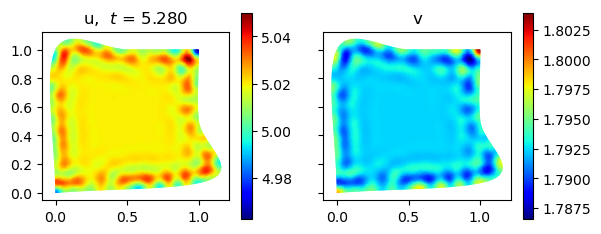

br_var_1_010.png


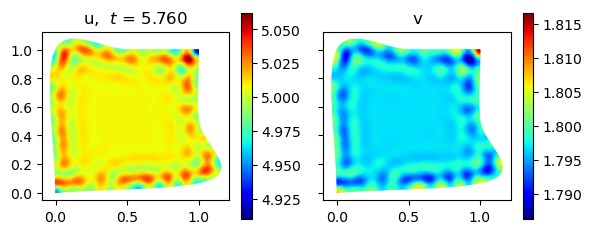

br_var_1_011.png


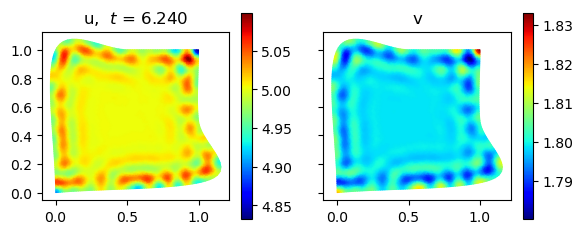

br_var_1_012.png


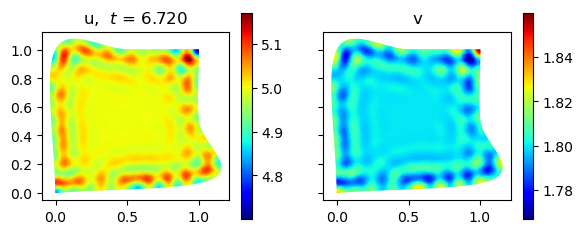

br_var_1_013.png


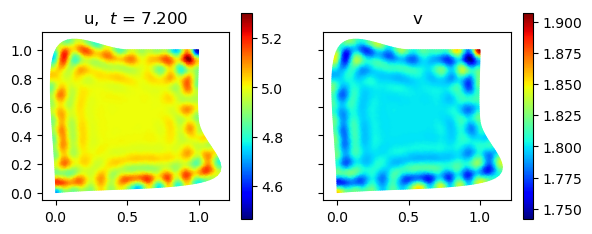

br_var_1_014.png


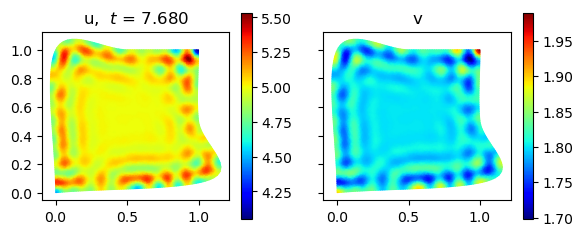

br_var_1_015.png


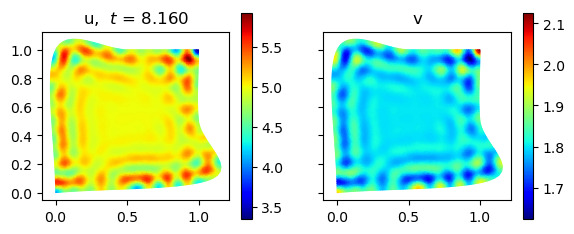

br_var_1_016.png


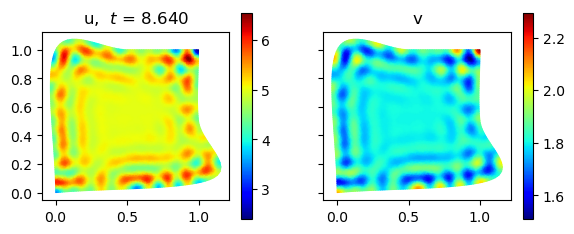

br_var_1_017.png


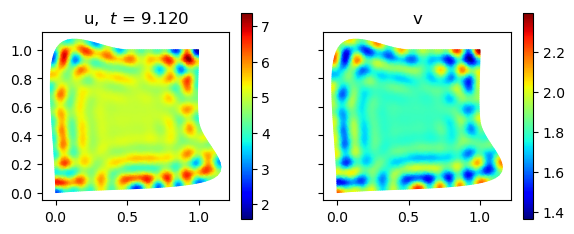

br_var_1_018.png


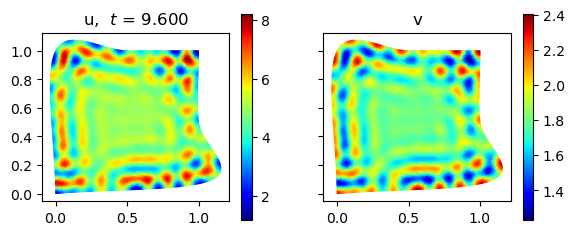

br_var_1_019.png


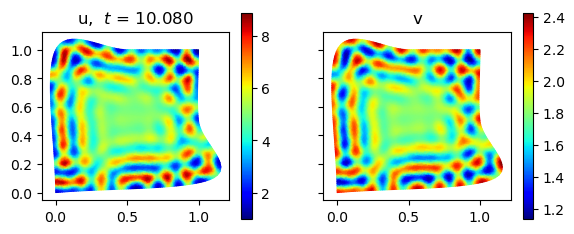

br_var_1_020.png


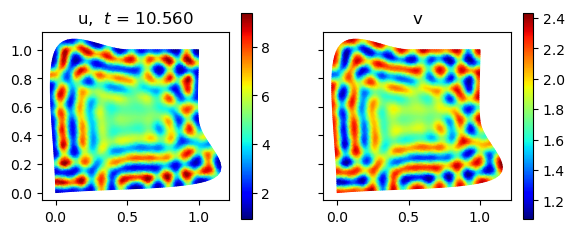

br_var_1_021.png


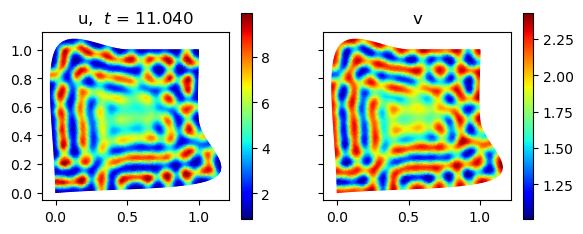

br_var_1_022.png


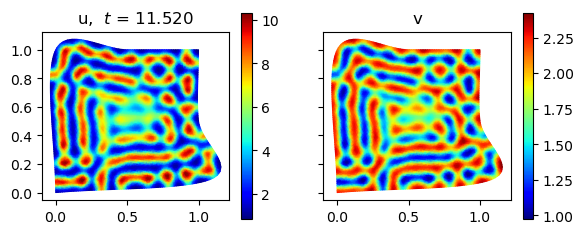

br_var_1_023.png


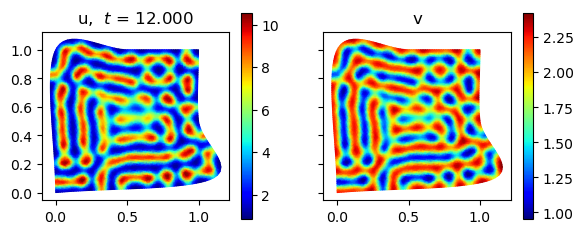

br_var_1_024.png


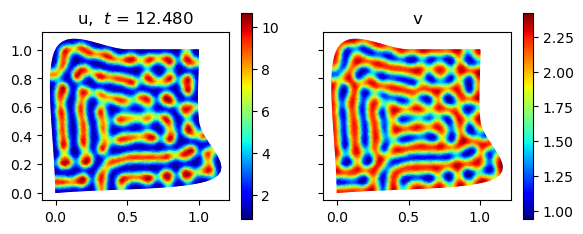

br_var_1_025.png


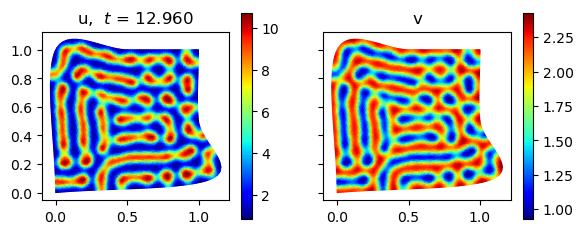

br_var_1_026.png


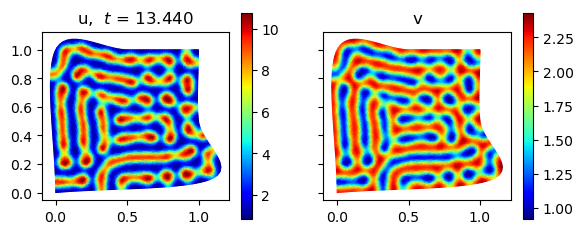

br_var_1_027.png


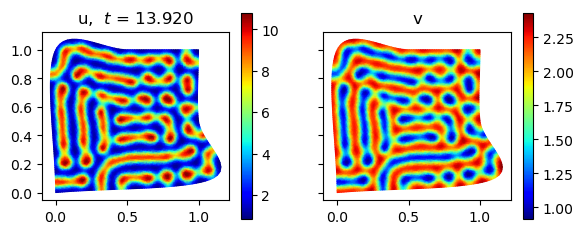

br_var_1_028.png


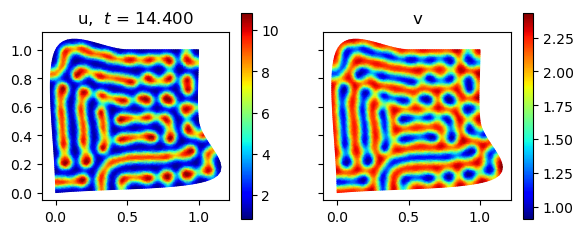

br_var_1_029.png


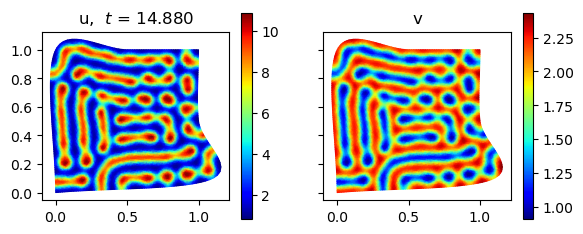

br_var_1_030.png


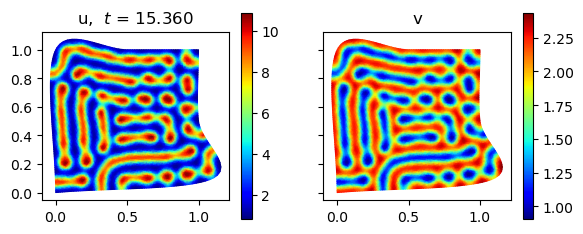

br_var_1_031.png


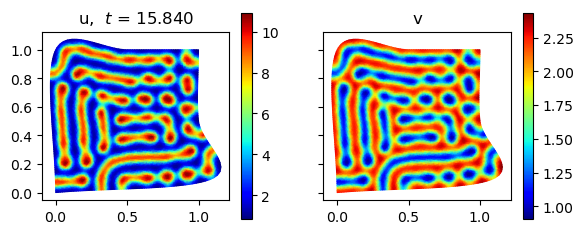

br_var_1_032.png


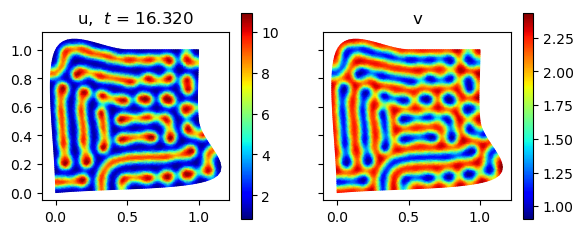

br_var_1_033.png


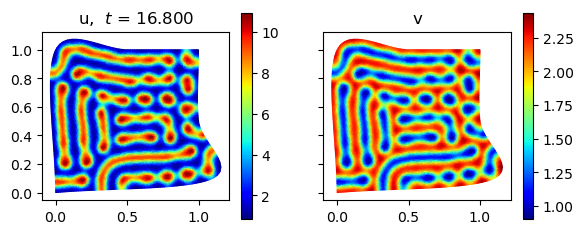

br_var_1_034.png


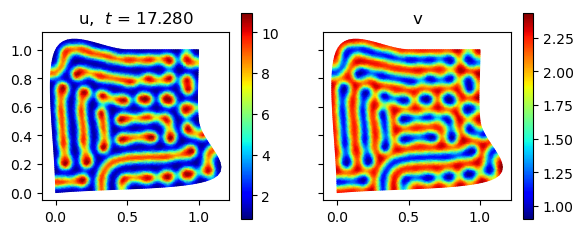

br_var_1_035.png


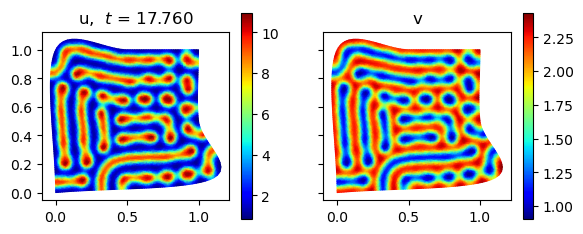

br_var_1_036.png


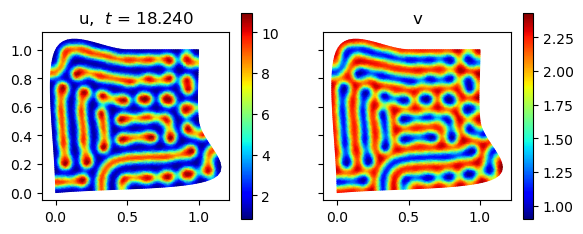

br_var_1_037.png


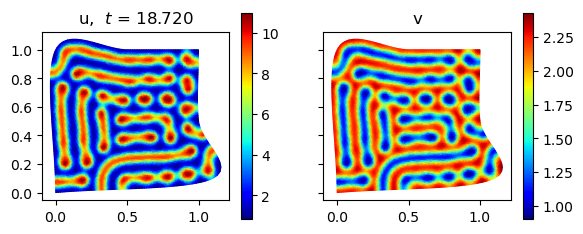

br_var_1_038.png


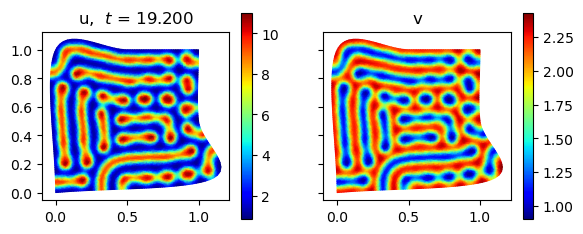

br_var_1_039.png


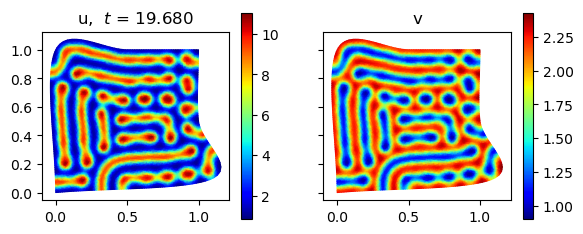

br_var_1_040.png


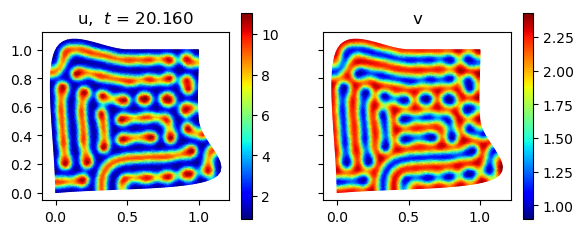

br_var_1_041.png


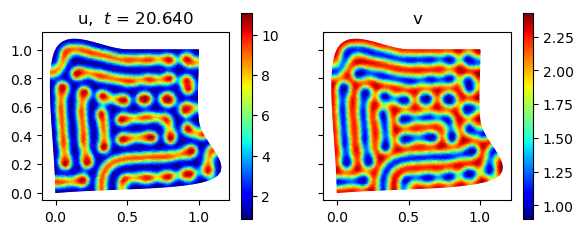

br_var_1_042.png


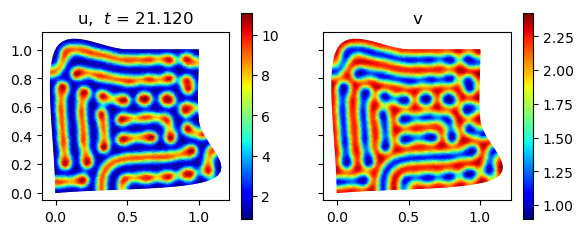

br_var_1_043.png


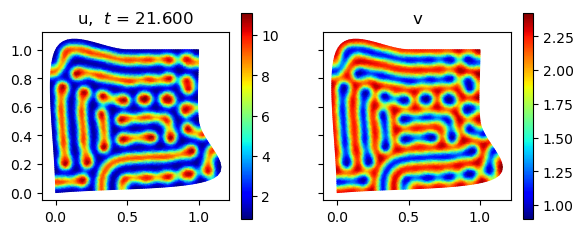

br_var_1_044.png


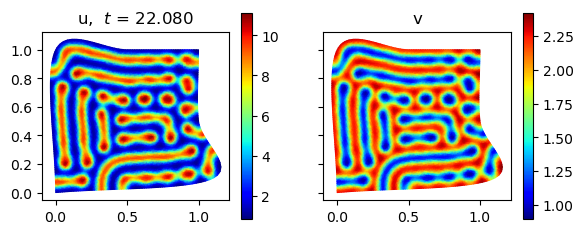

br_var_1_045.png


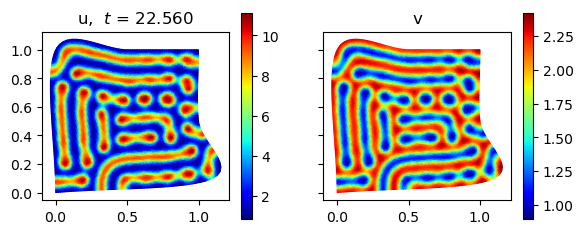

br_var_1_046.png


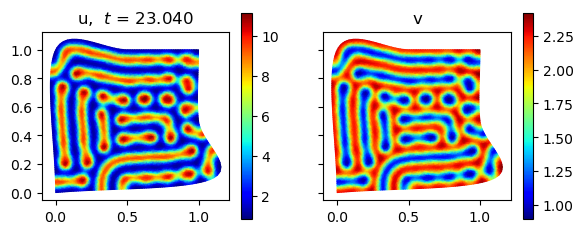

br_var_1_047.png


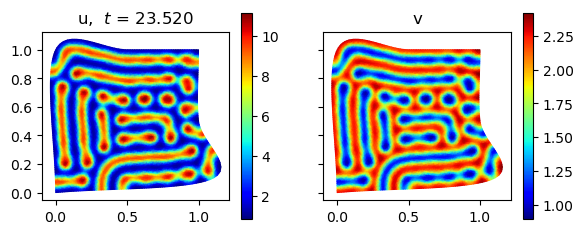

br_var_1_048.png


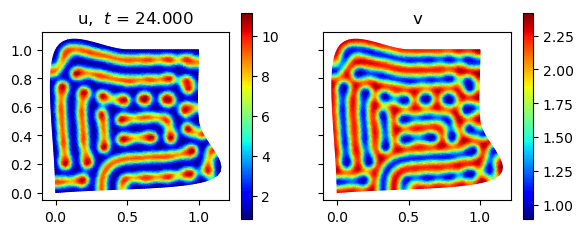

br_var_1_049.png


In [10]:
u = np.copy(sim1.u_init); v = np.copy(sim1.v_init);   t=0.0
sim1.alpha = 5.; sim1.beta = 9.
nmax = 12000
dn = int(nmax/50)
dd = int(nmax/dn)
froot = 'br_var_1'
for i in range(dd):
    for j in range(dn):
        t, u, v = one_step(t, u,v,sim1)  
    mkpngs(froot, i, new_mesh,u,v,basis,t)

/var/folders/l_/tk7gphlj0d38754sb6x8p1f00000gn/T/ipykernel_38167/4293279018.py:122: SparseEfficiencyWarning: splu converted its input to CSC format
  backsolve_1 = splu(A_1_csc.T).solve
/var/folders/l_/tk7gphlj0d38754sb6x8p1f00000gn/T/ipykernel_38167/4293279018.py:123: SparseEfficiencyWarning: splu converted its input to CSC format
  backsolve_2 = splu(A_2_csc.T).solve


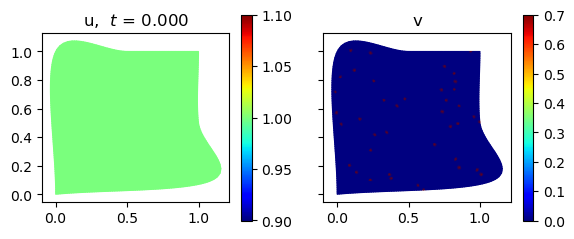

In [12]:

D_u  = 3.0e-5  #diffusion coefficients  for Gray Scott model 
D_v = D_u/2
dt = .1    # timestep 
sim2 = sim_info(D_u,D_v,dt,'GS',new_mesh,basis)
# get ops and initial conditions 
mkops(sim2)

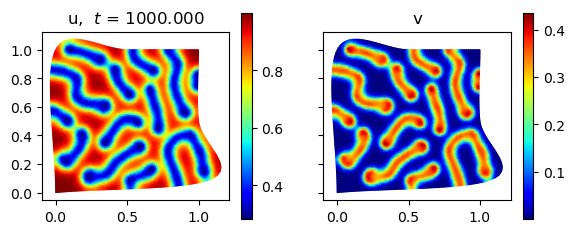

(<Figure size 600x300 with 4 Axes>,
 array([<Axes: title={'center': 'u,  $t$ = 1000.000'}>,
        <Axes: title={'center': 'v'}>], dtype=object))

In [49]:
u = np.copy(sim2.u_init); v = np.copy(sim2.v_init); t=0.0; 
#alpha = 0.035;  beta = 0.06 # choose some nice GS params 0.0780, k 0.0610    
#alpha = 0.082;  beta = 0.061
sim2.alpha = 0.05;  sim2.beta = 0.063
for i in range(10000):
    t, u, v = one_step(t,u,v,sim2)  
disp(new_mesh,u,v,basis,t)

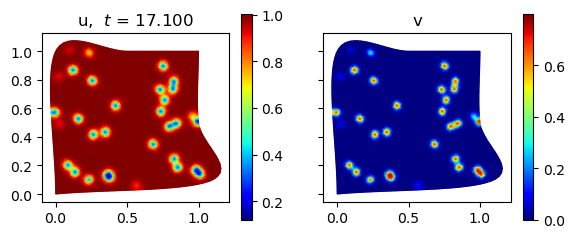

gs_var_2_000.png


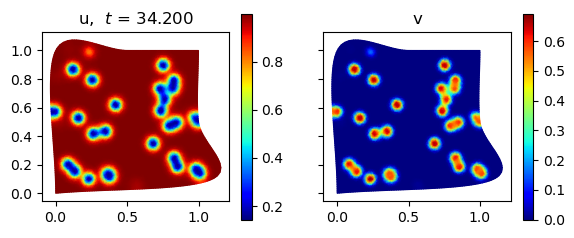

gs_var_2_001.png


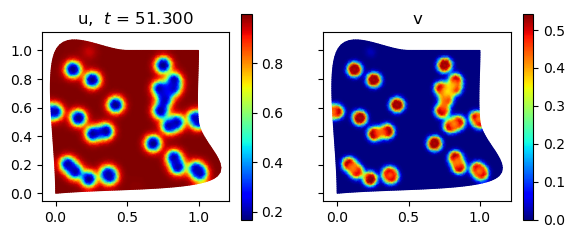

gs_var_2_002.png


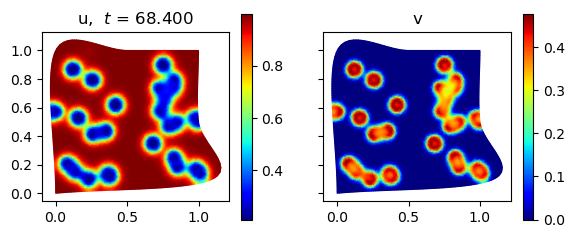

gs_var_2_003.png


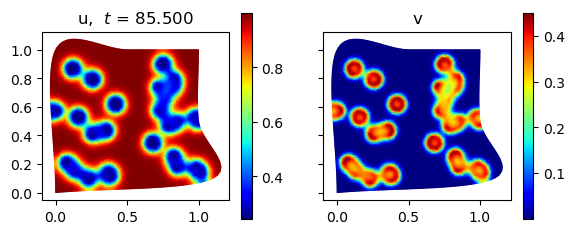

gs_var_2_004.png


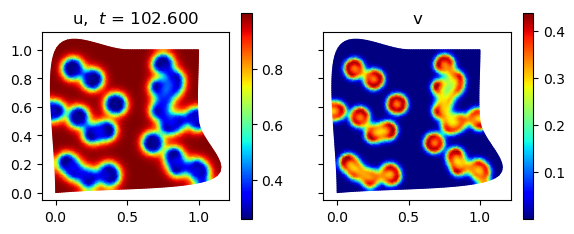

gs_var_2_005.png


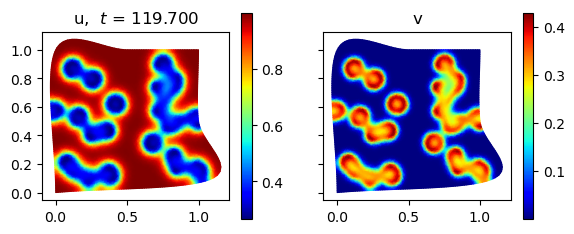

gs_var_2_006.png


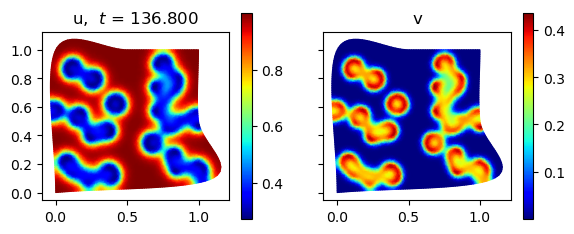

gs_var_2_007.png


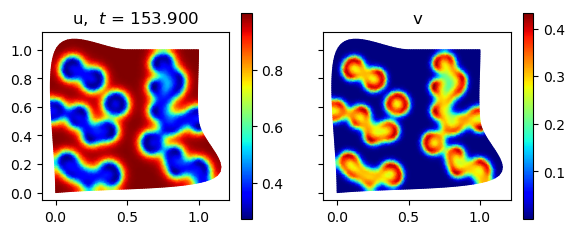

gs_var_2_008.png


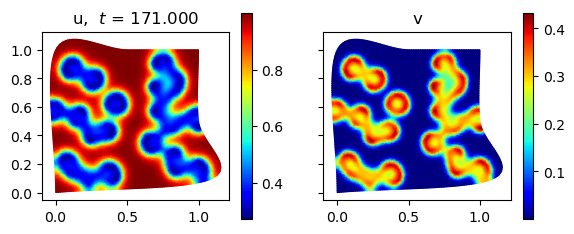

gs_var_2_009.png


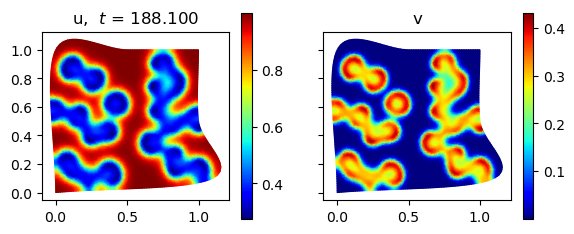

gs_var_2_010.png


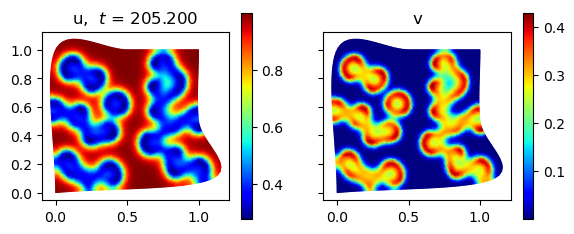

gs_var_2_011.png


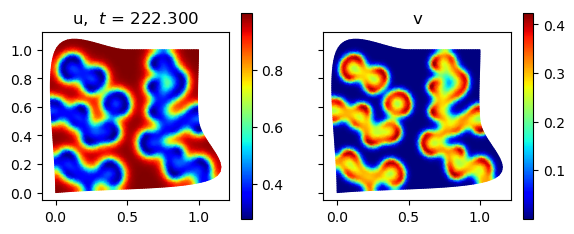

gs_var_2_012.png


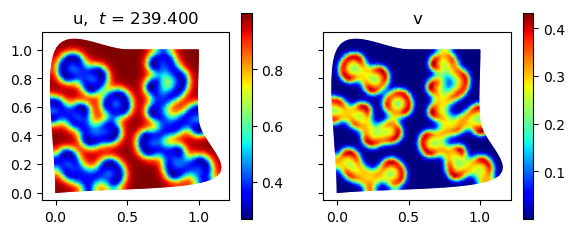

gs_var_2_013.png


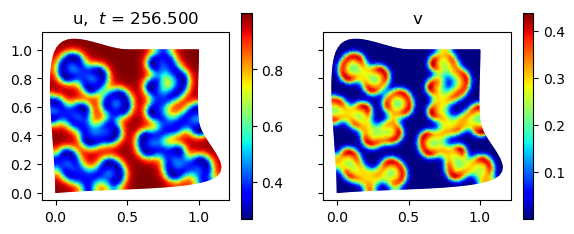

gs_var_2_014.png


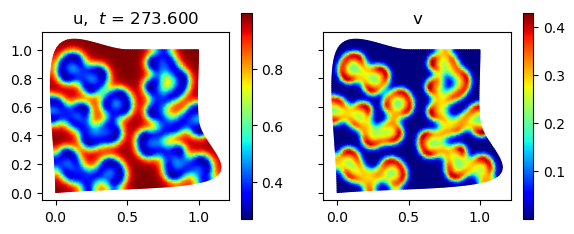

gs_var_2_015.png


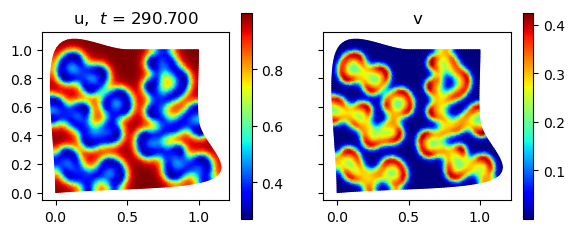

gs_var_2_016.png


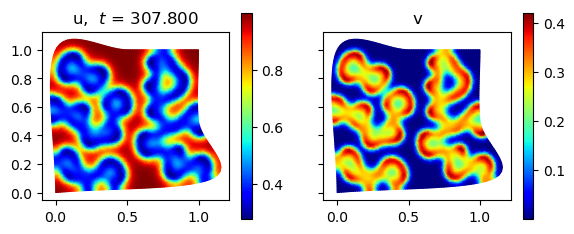

gs_var_2_017.png


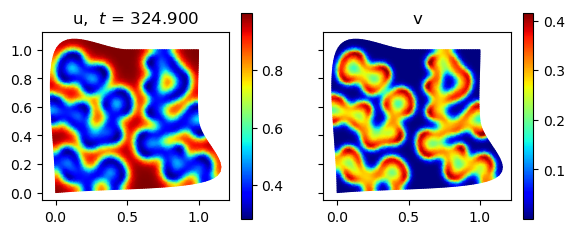

gs_var_2_018.png


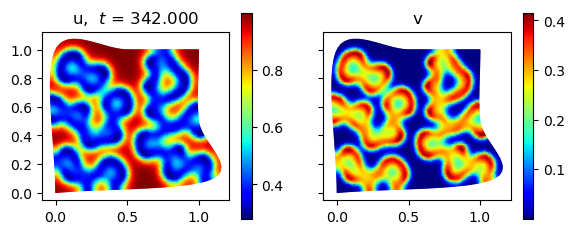

gs_var_2_019.png


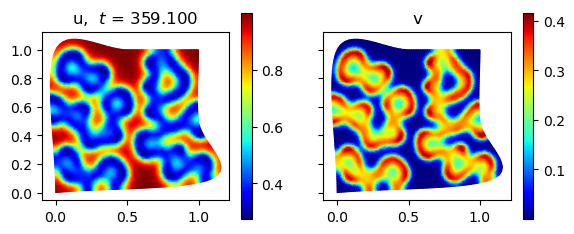

gs_var_2_020.png


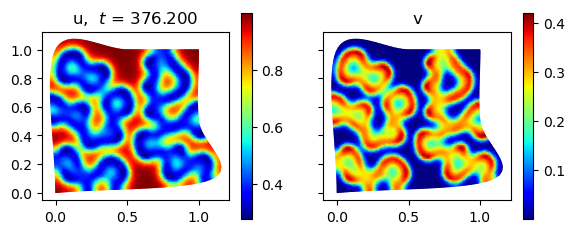

gs_var_2_021.png


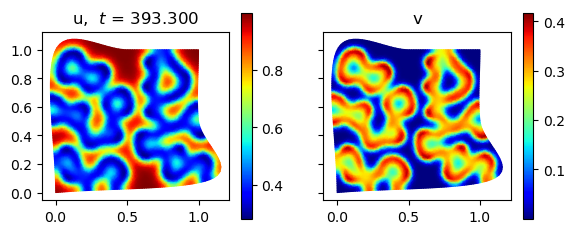

gs_var_2_022.png


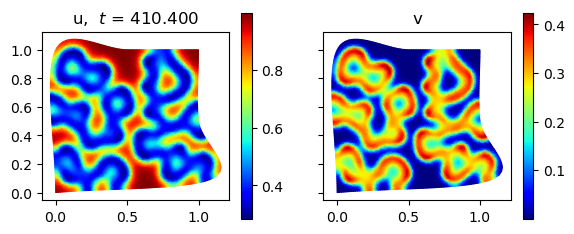

gs_var_2_023.png


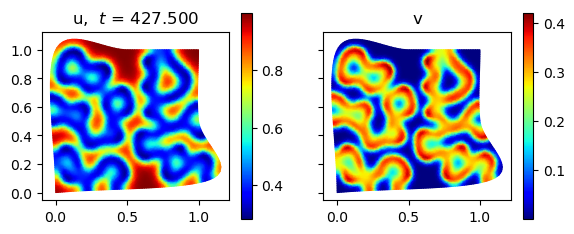

gs_var_2_024.png


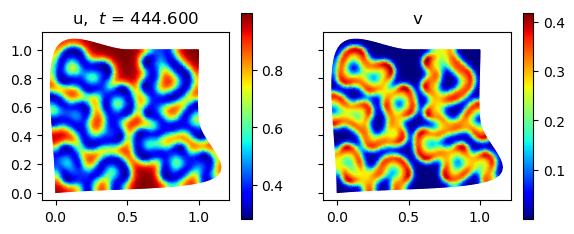

gs_var_2_025.png


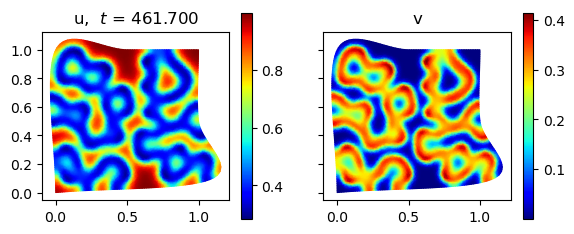

gs_var_2_026.png


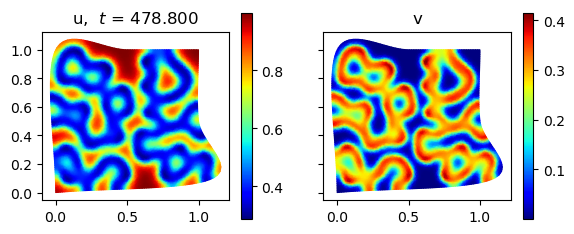

gs_var_2_027.png


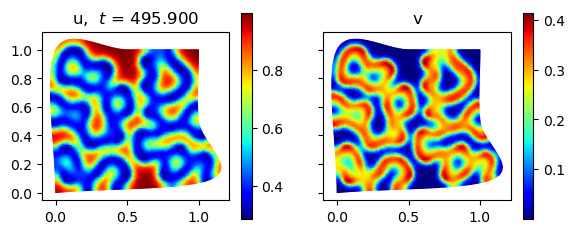

gs_var_2_028.png


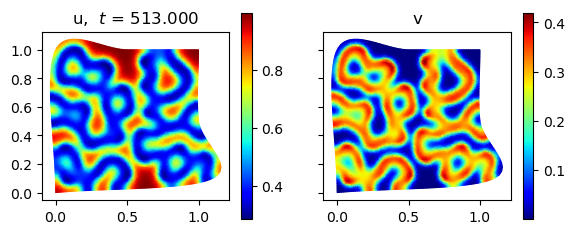

gs_var_2_029.png


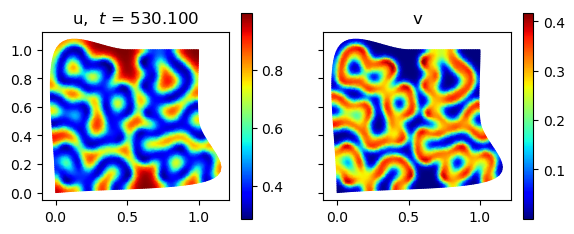

gs_var_2_030.png


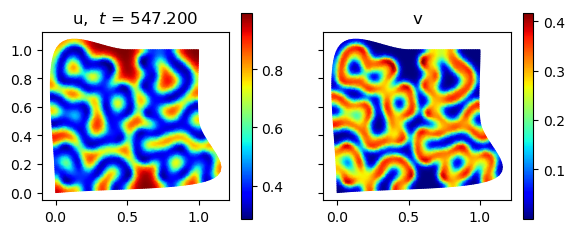

gs_var_2_031.png


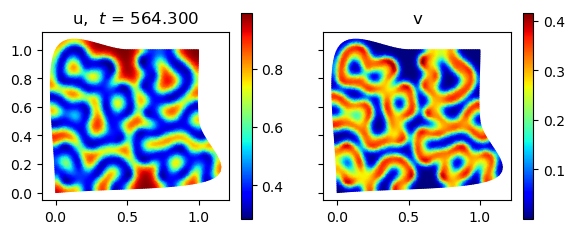

gs_var_2_032.png


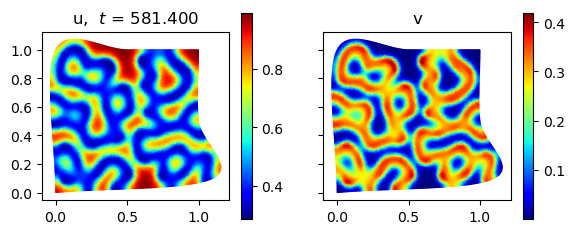

gs_var_2_033.png


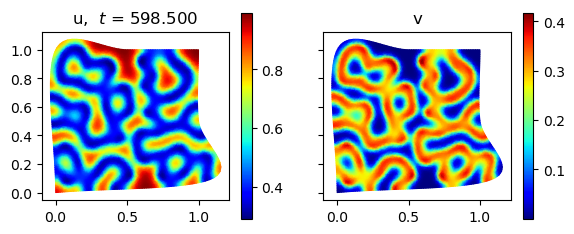

gs_var_2_034.png


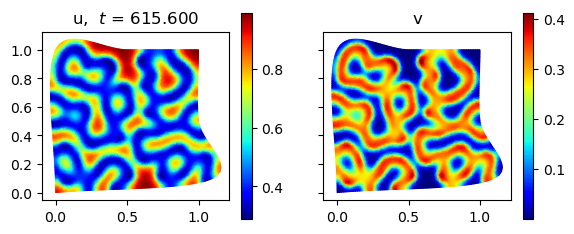

gs_var_2_035.png


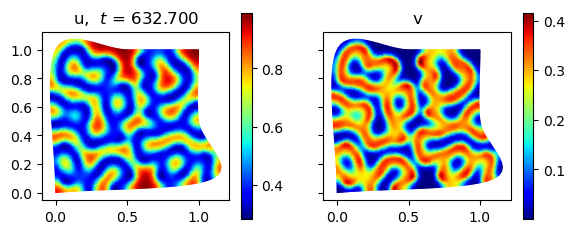

gs_var_2_036.png


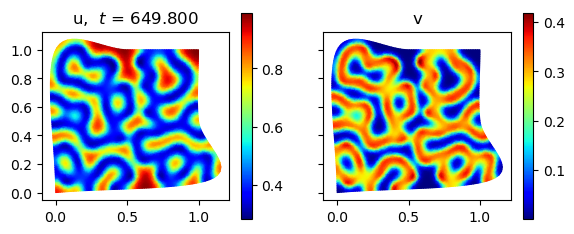

gs_var_2_037.png


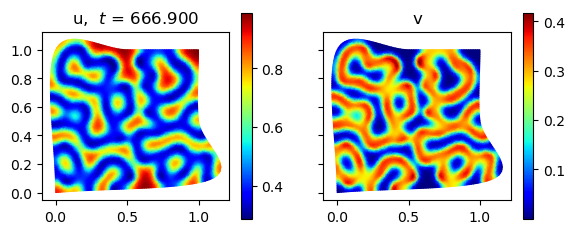

gs_var_2_038.png


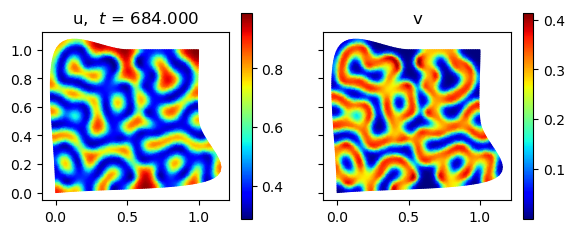

gs_var_2_039.png


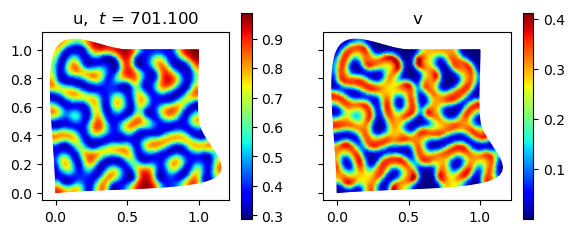

gs_var_2_040.png


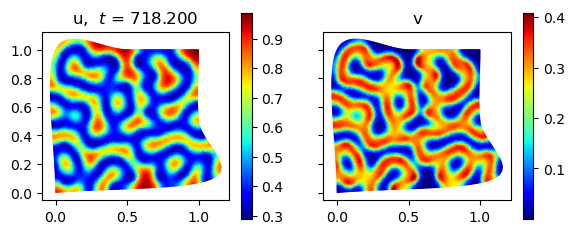

gs_var_2_041.png


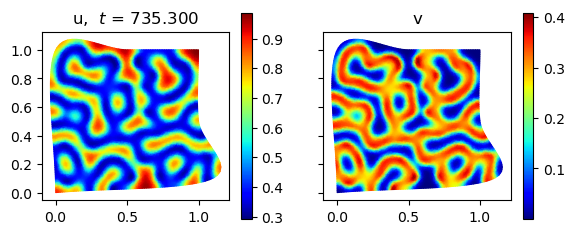

gs_var_2_042.png


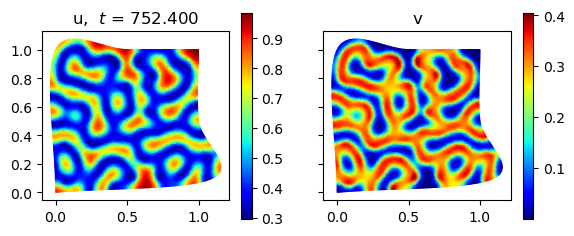

gs_var_2_043.png


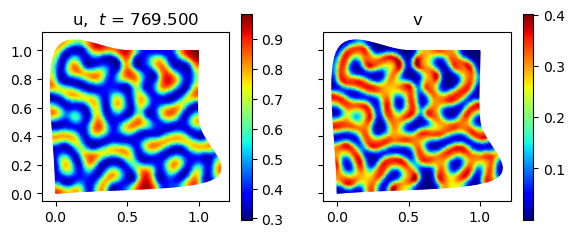

gs_var_2_044.png


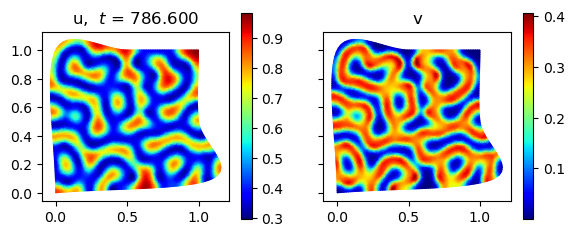

gs_var_2_045.png


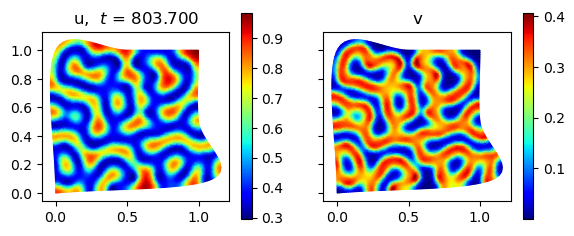

gs_var_2_046.png


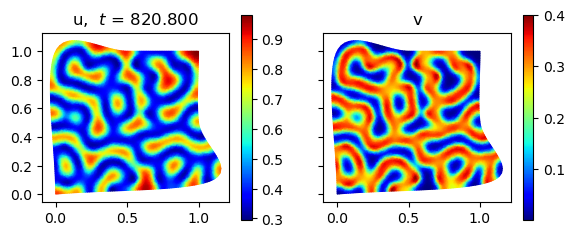

gs_var_2_047.png


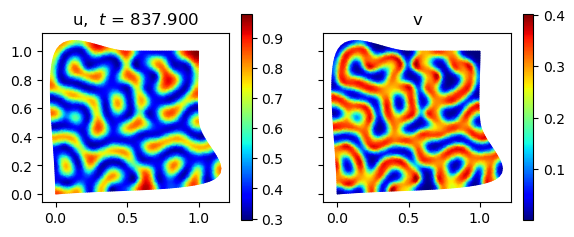

gs_var_2_048.png


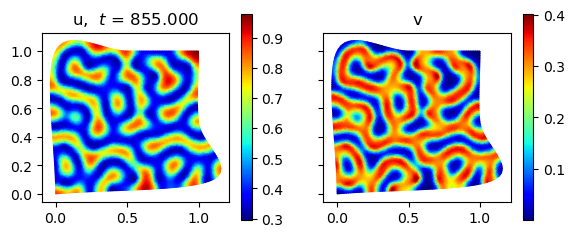

gs_var_2_049.png


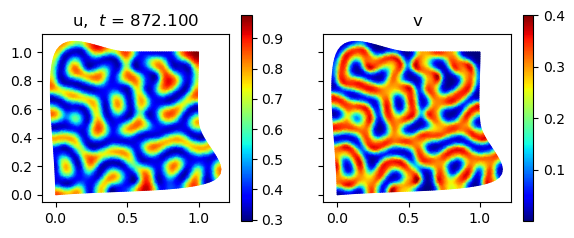

gs_var_2_050.png


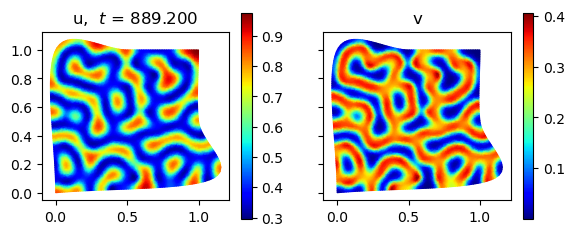

gs_var_2_051.png


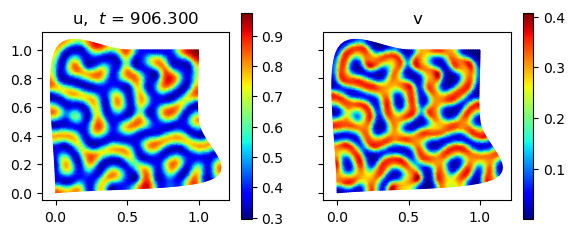

gs_var_2_052.png


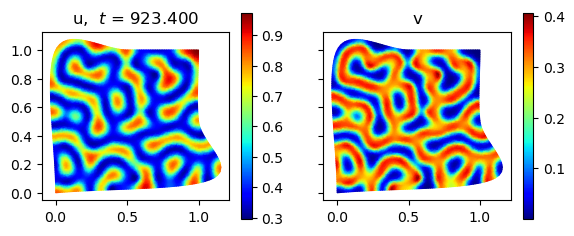

gs_var_2_053.png


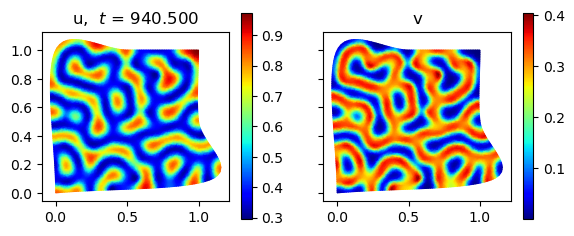

gs_var_2_054.png


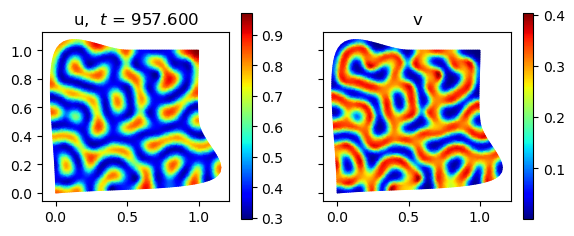

gs_var_2_055.png


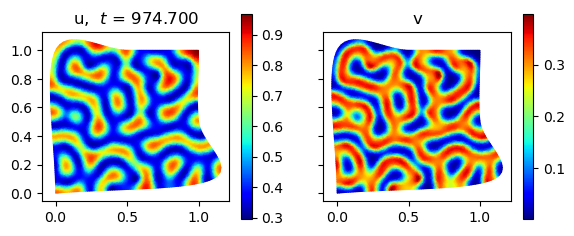

gs_var_2_056.png


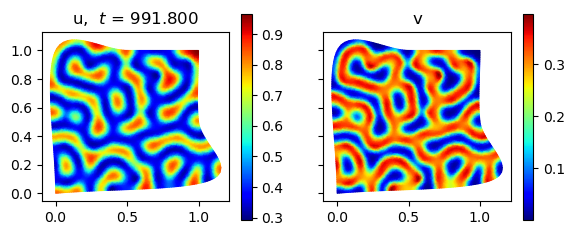

gs_var_2_057.png


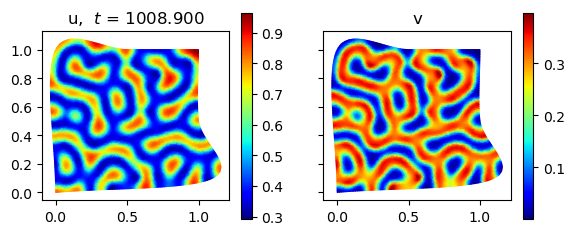

gs_var_2_058.png


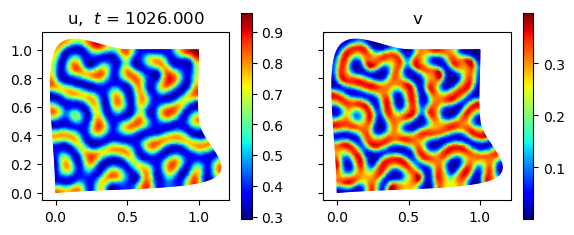

gs_var_2_059.png


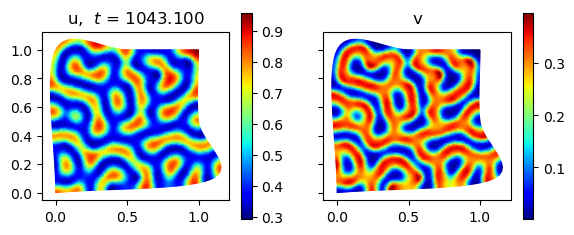

gs_var_2_060.png


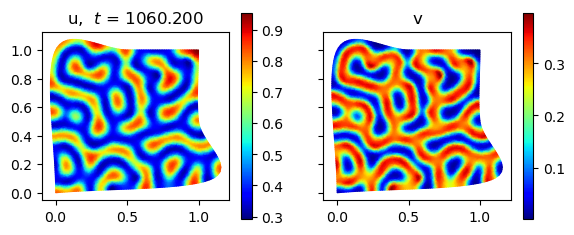

gs_var_2_061.png


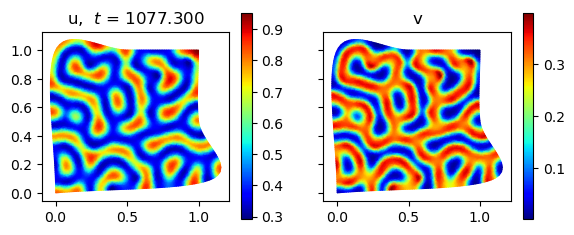

gs_var_2_062.png


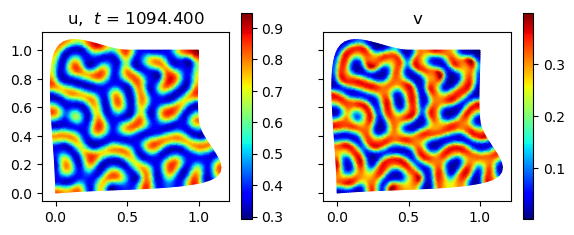

gs_var_2_063.png


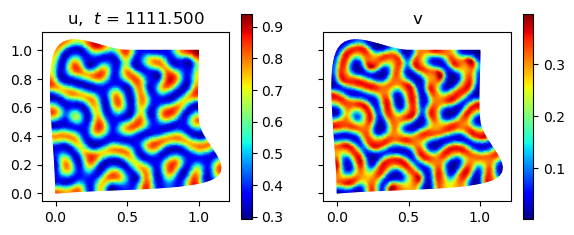

gs_var_2_064.png


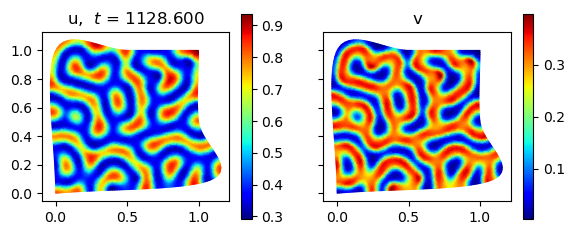

gs_var_2_065.png


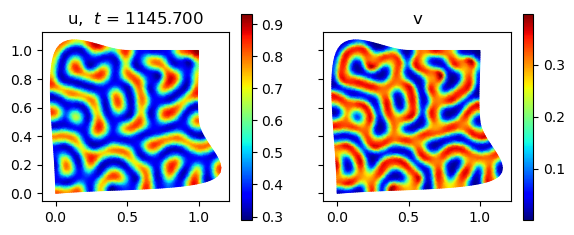

gs_var_2_066.png


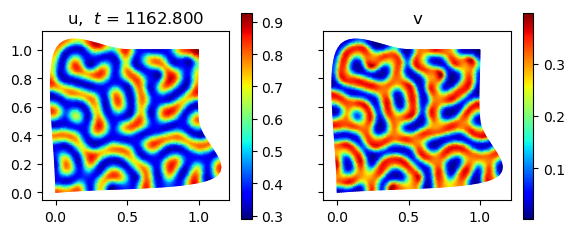

gs_var_2_067.png


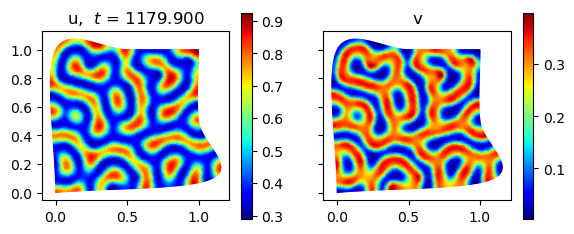

gs_var_2_068.png


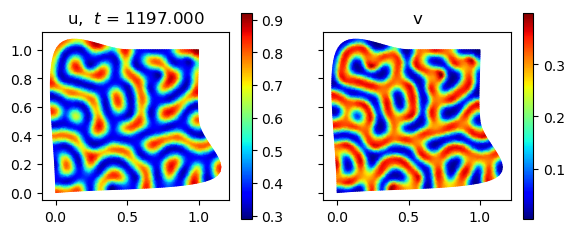

gs_var_2_069.png


In [13]:
u = np.copy(sim2.u_init); v = np.copy(sim2.v_init);   t=0.0
sim2.alpha = 0.05;  sim2.beta = 0.061
#alpha = 0.082;  beta = 0.063
nmax = 12000
dn = int(nmax/70)
dd = int(nmax/dn)
froot = 'gs_var_2'
for i in range(dd):
    for j in range(dn):
        t, u, v = one_step(t, u,v,sim2)  
    mkpngs(froot, i, new_mesh,u,v,basis,t)

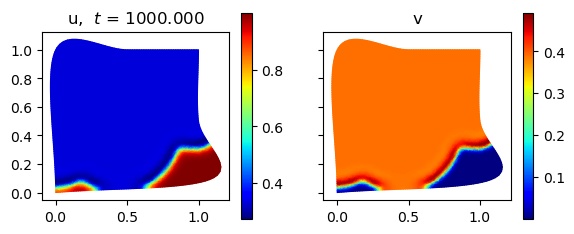

(<Figure size 600x300 with 4 Axes>,
 array([<Axes: title={'center': 'u,  $t$ = 1000.000'}>,
        <Axes: title={'center': 'v'}>], dtype=object))

In [71]:
u = np.copy(sim2.u_init); v = np.copy(sim2.v_init); t=0.0; 
#sim2.alpha = 0.035;  sim2.beta = 0.06 # choose some nice GS params 0.0780, k 0.0610    
sim2.alpha = 0.075;  sim2.beta = 0.054  # was 
#sim2.alpha = 0.082;  sim2.beta = 0.061  # 
#sim2.alpha = 0.05;  sim2.beta = 0.063
for i in range(10000):
    t, u, v = one_step(t,u,v,sim2)  
disp(new_mesh,u,v,basis,t)

/var/folders/l_/tk7gphlj0d38754sb6x8p1f00000gn/T/ipykernel_13444/2078124936.py:122: SparseEfficiencyWarning: splu converted its input to CSC format
  backsolve_1 = splu(A_1_csc.T).solve
/var/folders/l_/tk7gphlj0d38754sb6x8p1f00000gn/T/ipykernel_13444/2078124936.py:123: SparseEfficiencyWarning: splu converted its input to CSC format
  backsolve_2 = splu(A_2_csc.T).solve


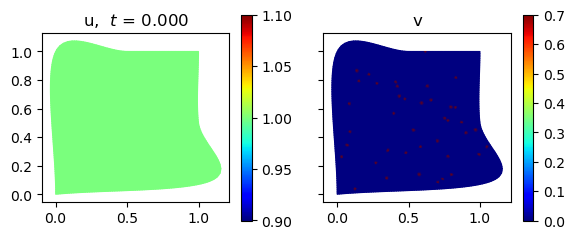

In [73]:
D_u  = 1.0e-5  #diffusion coefficients  for Gray Scott model 
D_v = D_u/2
dt = .1    # timestep 
sim3 = sim_info(D_u,D_v,dt,'GS',new_mesh,basis)
# get ops and initial conditions 
mkops(sim3)

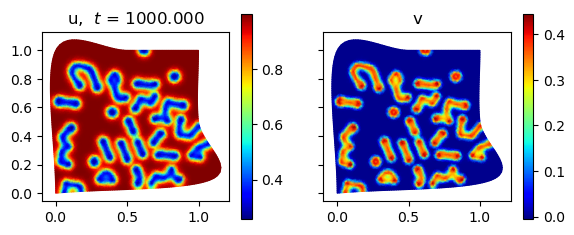

(<Figure size 600x300 with 4 Axes>,
 array([<Axes: title={'center': 'u,  $t$ = 1000.000'}>,
        <Axes: title={'center': 'v'}>], dtype=object))

In [75]:
u = np.copy(sim3.u_init); v = np.copy(sim3.v_init); t=0.0; 
#sim2.alpha = 0.035;  sim2.beta = 0.06 # choose some nice GS params 0.0780, k 0.0610    
sim3.alpha = 0.055;  sim3.beta = 0.062
#sim2.alpha = 0.05;  sim2.beta = 0.063
for i in range(10000):
    t, u, v = one_step(t,u,v,sim3)  
disp(new_mesh,u,v,basis,t)